In [1]:
import tensorflow as tf
import tools.datasets.mnist as mnist_tools
import tools.semisup as semisup
import numpy as np
import architectures as arch
from functools import partial

import tools.visualization as vis
import tools.updated_semisup as up

%load_ext autoreload
%autoreload 2

import sys

mnist_train_images, mnist_train_labels = mnist_tools.get_data('train')
mnist_test_images, mnist_test_labels = mnist_tools.get_data('test')
mnistu_train_images, mnistu_train_labels = mnist_tools.get_data('train')
mnistu_test_images, mnistu_test_labels = mnist_tools.get_data('test')

/home/frankzl/.envs/env36-ml/.venv/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


Extracting /home/frankzl/datasets/mnist//train-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist//train-labels-idx1-ubyte.gz
Extracting /home/frankzl/datasets/mnist//t10k-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist//t10k-labels-idx1-ubyte.gz
Extracting /home/frankzl/datasets/mnist//train-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist//train-labels-idx1-ubyte.gz
Extracting /home/frankzl/datasets/mnist//t10k-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist//t10k-labels-idx1-ubyte.gz


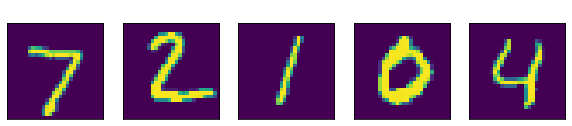

In [2]:
vis.imshow(mnistu_test_images[0:5], channels=1, imgwidth=28)

In [42]:
# labeled samples used per class
# sup_per_class = 10
sup_per_class = 10
sup_seed = -1
# labeled samples per class per batch
sup_per_batch = 10
# unlabeled samples per batch
unsup_batch_size = 500
unsup_samples = -1

learning_rate = 1e-4
decay_steps = 5000
decay_factor = 0.33
logit_weight = 1.0

max_steps = 1500
eval_interval = 500

seed = 1

IMAGE_SHAPE = mnist_tools.IMAGE_SHAPE
NUM_LABELS = mnist_tools.NUM_LABELS

# [10 (classes), 10 (samples), 28, 28, 1]
sup_by_label = semisup.sample_by_label(mnist_train_images, mnist_train_labels,
                        sup_per_class, NUM_LABELS, seed)

visit_weight_envelope = "linear"
visit_weight = 1
visit_weight_envelope_steps = 1
visit_weight_envelope_delay = 500

walker_weight_envelope = "linear"
walker_weight = 1
walker_weight_envelope_steps = 1
walker_weight_envelope_delay = 500

TARGET_SHAPE = mnist_tools.IMAGE_SHAPE
TEST_SHAPE   = TARGET_SHAPE

image_shape = IMAGE_SHAPE
new_shape   = TARGET_SHAPE
emb_size    = 128

sampled_unsup_images = mnistu_train_images
sampled_unsup_labels = mnistu_train_labels

In [43]:
from ipywidgets import IntProgress, Layout
from train import apply_envelope
store_dir = "logs/training/mnist-mnist/model"
graph = tf.Graph()

with graph.as_default():
    
    unsup_data = up.create_input(sampled_unsup_images, sampled_unsup_labels, unsup_batch_size)
    unsup_it   = unsup_data.make_initializable_iterator()
    
    t_unsup_images,t_unsup_labels = unsup_it.get_next()
    
    sup_data,sup_label = up.create_per_class_inputs_v2(sup_by_label, sup_per_batch)
    sup_it             = sup_data.repeat().make_one_shot_iterator()
    sup_it_label       = sup_label.repeat().make_one_shot_iterator()
    
    
    model = semisup.SemisupModel(arch.mnist_model, NUM_LABELS, IMAGE_SHAPE,
                                 test_in=tf.placeholder(np.float32, [None] + TEST_SHAPE, 'test_in')
                                )
    
    t_sup_images, t_sup_labels = tf.concat( sup_it.get_next(), 0), tf.concat( sup_it_label.get_next(), 0)
    
    t_sup_emb   = model.image_to_embedding(t_sup_images)
    t_unsup_emb = model.image_to_embedding(t_unsup_images)
    
    t_sup_logit = model.embedding_to_logit(t_sup_emb)
    
    visit_weight = apply_envelope(
        type = visit_weight_envelope,
        step = model.step,
        final_weight = visit_weight,
        growing_steps = visit_weight_envelope_steps,
        delay = visit_weight_envelope_delay
    )
    
    walker_weight = apply_envelope(
        type = walker_weight_envelope,
        step = model.step,
        final_weight = walker_weight,
        growing_steps = walker_weight_envelope_steps,
        delay = walker_weight_envelope_delay
    )
    
    tf.summary.scalar("Weights_Visit", visit_weight)
    tf.summary.scalar("Weight_Walker", walker_weight)
    
    model.add_logit_loss(t_sup_logit, t_sup_labels, weight=logit_weight)
    
    #model.add_semisup_loss(t_sup_emb, t_unsup_emb, t_sup_labels, visit_weight=visit_weight, walker_weight=walker_weight)
    equality_matrix = tf.equal(tf.reshape(t_sup_labels, [-1, 1]), t_sup_labels)
    equality_matrix = tf.cast(equality_matrix, tf.float32)
    p_target = (equality_matrix / tf.reduce_sum(
        equality_matrix, [1], keepdims=True))

    match_ab = tf.matmul(t_sup_emb, t_unsup_emb, transpose_b=True, name='match_ab')
    p_ab = tf.nn.softmax(match_ab, name='p_ab')
    p_ba = tf.nn.softmax(tf.transpose(match_ab), name='p_ba')
    p_aba = tf.matmul(p_ab, p_ba, name='p_aba')

    model.create_walk_statistics(p_aba, equality_matrix)
    
    loss_aba = tf.losses.softmax_cross_entropy(
        p_target,
        tf.log(1e-8 + p_aba),
        weights=walker_weight,
        scope='loss_aba')
    model.add_visit_loss(p_ab, visit_weight)

    semb_dt, uemb_dt = tf.gradients([match_ab], [t_sup_emb, t_unsup_emb])
    
    tf.summary.scalar('Loss_aba', loss_aba)
    
    t_learning_rate = tf.train.exponential_decay(
        learning_rate,
        model.step,
        decay_steps,
        decay_factor,
        staircase = True
    )
    
    train_op = model.create_train_op(t_learning_rate)
    summary_op = tf.summary.merge_all()
    
    summary_writer = tf.summary.FileWriter(store_dir, graph)
    
    saver = tf.train.Saver(max_to_keep=30)

---------
Variables: name (type shape) [size]
---------
net/conv1_1/weights:0 (float32_ref 3x3x1x32) [288, bytes: 1152]
net/conv1_1/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv1_2/weights:0 (float32_ref 3x3x32x32) [9216, bytes: 36864]
net/conv1_2/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv2_1/weights:0 (float32_ref 3x3x32x64) [18432, bytes: 73728]
net/conv2_1/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv2_2/weights:0 (float32_ref 3x3x64x64) [36864, bytes: 147456]
net/conv2_2/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv3_1/weights:0 (float32_ref 3x3x64x128) [73728, bytes: 294912]
net/conv3_1/biases:0 (float32_ref 128) [128, bytes: 512]
net/conv3_2/weights:0 (float32_ref 3x3x128x128) [147456, bytes: 589824]
net/conv3_2/biases:0 (float32_ref 128) [128, bytes: 512]
net/fc1/weights:0 (float32_ref 1152x128) [147456, bytes: 589824]
net/fc1/biases:0 (float32_ref 128) [128, bytes: 512]
net/fully_connected/weights:0 (float32_ref 128x10) [1280, bytes: 5120]
net/fully_c

In [44]:
import time
import datetime
test_images = mnistu_test_images[:2000]
test_labels = mnistu_test_labels[:2000]
store_dir

'logs/training/mnist-mnist/model'

In [7]:
from IPython.display import display

max_steps = 1502
f = IntProgress(min=0, max=max_steps, layout= Layout(width="100%")) # instantiate the bar
display(f) # display the bar

sesh = tf.Session(graph = graph, config=tf.ConfigProto(intra_op_parallelism_threads=2, allow_soft_placement=True))

eval_interval = 100

p_aba_list = []
match_ab_list = []
t_sup_emb_list = []
t_unsup_emb_list = []
losses = []

with sesh as sess:
    
    sess.run(unsup_it.initializer)
    sess.run(tf.global_variables_initializer())
    
    epoch = 0
    
    for step in range(0, max_steps):
        t0 = time.time()
        try:
            loss, _, summaries = sess.run([model.train_loss, train_op, summary_op])
        except tf.errors.OutOfRangeError:
            sess.run(unsup_it.initializer)
            epoch += 1
            
            loss, _, summaries = sess.run([model.train_loss, train_op, summary_op])
           
        f.value = step
        f.description = f"Ep{epoch}:{step}/{max_steps}"
            
        losses.append(loss)
        if (step) % eval_interval == 0:
            
            t1 = time.time()
            print(f"Time left: {datetime.timedelta(seconds=int((t1-t0)*(max_steps-step)))}s")
            
            print('Step: %d' % step)
            test_pred = model.classify(test_images).argmax(-1)
            conf_mtx = semisup.confusion_matrix(test_labels, test_pred, NUM_LABELS)
            test_err = (test_labels != test_pred).mean() * 100
            print(conf_mtx)
            print('Test error: %.2f %%' % test_err)
            print(f'Loss: {loss}')
            print()
    
            test_summary = tf.Summary(
                value=[tf.Summary.Value(
                    tag='Test Err', simple_value=test_err)])
    
            summary_writer.add_summary(summaries, step)
            summary_writer.add_summary(test_summary, step)

            print(f"saving model - step {step}")
            saver.save(sess, store_dir, global_step=model.step)

IntProgress(value=0, layout=Layout(width='100%'), max=1502)

Time left: 1:18:58s
Step: 0
[[  0   0   0   0 175   0   0   0   0   0]
 [  0   0   0 167  10   0  10  11  36   0]
 [  0   0   0  25 190   0   0   1   3   0]
 [  0   0   0  31 170   0   0   1   5   0]
 [  0   0   0   9 202   0   0   0   6   0]
 [  0   0   0  23 140   0   0   1  15   0]
 [  0   0   0  23 148   0   0   0   7   0]
 [  1   0   0  32 159   0   0   6   7   0]
 [  0   0   0  31 151   0   0   0  10   0]
 [  0   0   0  18 170   0   0   0   5   1]]
Test error: 87.50 %
Loss: 2.596027374267578

saving model - step 0
Time left: 1:07:16s
Step: 100
[[158   0   7   1   0   3   2   1   3   0]
 [  0 192   1  40   0   0   1   0   0   0]
 [  0   0 164  27   1   0  13   2  12   0]
 [  1   0   2 171   0   2   1   4  18   8]
 [  0   0   0   0 132   0  29   7   2  47]
 [  3   2   4  24   1 115   9   2  10   9]
 [  4   2   2   0   1   3 160   2   4   0]
 [  0   3   3  50   1   0   0 117  22   9]
 [  4   0   1  18   0   3   4   2 151   9]
 [  0   0   0   5   4   0   0  14   9 162]]
Test error: 2

In [7]:
sembs = []
slabels = []
uembs = []
ulabels = []
similarities = []

for i in range(1, 1502, 100):
    with tf.Session(graph=graph) as sess:
        saver = tf.train.Saver()
        
        model_checkpoint = f"{store_dir}-{i}"
        saver.restore(sess, model_checkpoint)
        sess.run(unsup_it.initializer)
        
        semb, slabel, uemb, ulabel, sdt,udt, mabdt = sess.run([t_sup_emb, t_sup_labels, t_unsup_emb, t_unsup_labels, semb_dt, uemb_dt, mab_dt ])
        sembs.append(semb)
        uembs.append(uemb)
        slabels.append(slabel)
        ulabels.append(ulabel)
        stacked = np.vstack([semb, uemb[ulabel.argsort()]])
        stacked_similarity = stacked @ stacked.T
        similarities.append(stacked_similarity)

INFO:tensorflow:Restoring parameters from logs/training/mnist-mnist/model-1
INFO:tensorflow:Restoring parameters from logs/training/mnist-mnist/model-101
INFO:tensorflow:Restoring parameters from logs/training/mnist-mnist/model-201


KeyboardInterrupt: 

In [93]:
with tf.Session(graph=graph) as sess:
    saver = tf.train.Saver()
    
    model_checkpoint = f"{store_dir}-{601}"
    saver.restore(sess, model_checkpoint)
    sess.run(unsup_it.initializer)
    
    semb, slabel, uemb, ulabel, mab, sdt,udt = sess.run([t_sup_emb, t_sup_labels, t_unsup_emb, t_unsup_labels, match_ab, semb_dt, uemb_dt ])

INFO:tensorflow:Restoring parameters from logs/training/mnist-mnist/model-601


In [88]:
",".join([f"{i:.2f}" for i in list(np.mean(sdt, axis=0))])

'-83.90,-172.11,148.02,-65.46,-54.58,-37.72,40.42,-112.82,4.15,28.60,61.96,146.70,-32.71,-68.65,-155.06,24.53,-58.28,29.15,-105.32,-92.45,54.07,74.38,-33.97,6.47,-220.39,-53.72,-138.65,-52.99,-17.72,16.82,168.14,-136.74,-41.41,43.67,20.10,-12.55,39.93,80.69,-76.61,-68.03,-17.06,-67.62,74.20,-58.13,-66.72,-112.16,-57.55,9.03,41.63,-66.86,-45.59,115.81,-82.91,139.27,-93.52,-128.72,10.76,8.53,-88.23,-20.65,-68.46,-40.55,-52.74,15.13,-108.40,-105.93,-48.36,-123.58,-55.45,-80.98,-46.50,-15.61,94.06,219.45,-53.33,-11.92,-197.51,44.90,-42.40,15.07,45.39,-55.33,-143.23,-34.90,-16.98,-48.28,-94.18,111.96,-54.53,17.21,-86.80,94.52,50.99,-39.57,29.10,91.78,-102.82,-90.65,58.04,127.34,-100.27,-112.21,137.90,9.97,41.85,-58.45,-7.30,-102.21,-38.88,36.29,-94.87,38.38,11.77,35.71,71.93,-122.23,-70.67,122.44,65.09,-32.75,-135.49,-129.38,-104.97,33.69,86.31,44.52,-99.44,-30.96'

In [94]:
mab

array([[ 2.6416783 ,  5.745948  ,  2.576663  , ...,  4.0540767 ,
         0.72918606, -0.02866197],
       [ 2.5250015 ,  4.1174645 ,  2.568188  , ...,  4.1106195 ,
        -0.43509024, -0.9009829 ],
       [ 2.241235  ,  4.346894  ,  3.4348643 , ...,  3.6449275 ,
         0.39481318,  1.0105276 ],
       ...,
       [ 4.391174  ,  5.4446416 ,  2.8847787 , ...,  3.3080134 ,
         6.609354  ,  5.4434776 ],
       [ 3.0507796 ,  5.9380116 ,  0.9449655 , ...,  3.3660254 ,
         5.475416  ,  1.4123774 ],
       [ 1.767935  ,  5.490945  ,  1.5214386 , ...,  3.2920258 ,
         5.5478444 ,  1.8131342 ]], dtype=float32)

In [96]:
semb@uemb.T

array([[ 2.6416783 ,  5.745948  ,  2.576663  , ...,  4.054077  ,
         0.72918594, -0.02866147],
       [ 2.5250015 ,  4.1174645 ,  2.568188  , ...,  4.11062   ,
        -0.43509045, -0.9009831 ],
       [ 2.241235  ,  4.346894  ,  3.4348643 , ...,  3.6449277 ,
         0.3948133 ,  1.0105276 ],
       ...,
       [ 4.391174  ,  5.4446416 ,  2.8847787 , ...,  3.308013  ,
         6.6093535 ,  5.4434786 ],
       [ 3.0507796 ,  5.9380116 ,  0.9449655 , ...,  3.366025  ,
         5.4754167 ,  1.4123771 ],
       [ 1.767935  ,  5.490945  ,  1.5214386 , ...,  3.2920258 ,
         5.5478435 ,  1.8131336 ]], dtype=float32)

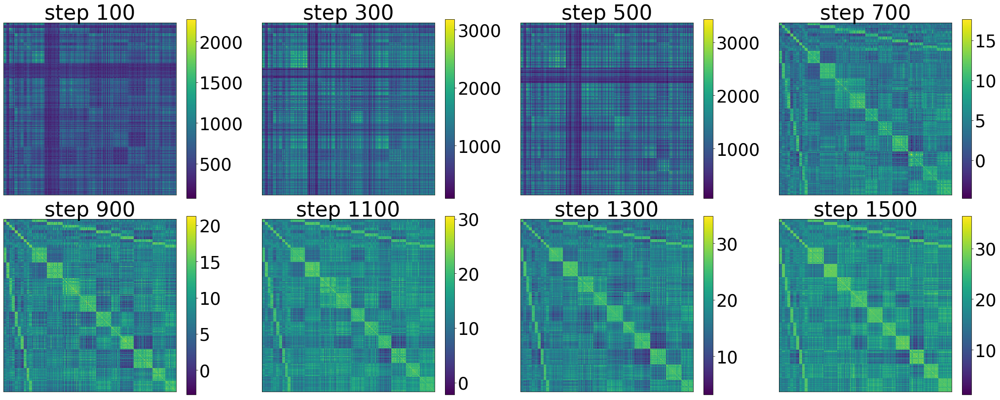

In [129]:
import matplotlib
matplotlib.rcParams.update({'font.size': 35})
vis.imshow(similarities[1::2], labels=[f"step {i}" for i in list(range(100,1502, 200))], imgwidth=600, 
           num_row=4, figsize=(36,14), hspace=0.1, cmap=True)
plt.savefig("dotsimilarity.svg")

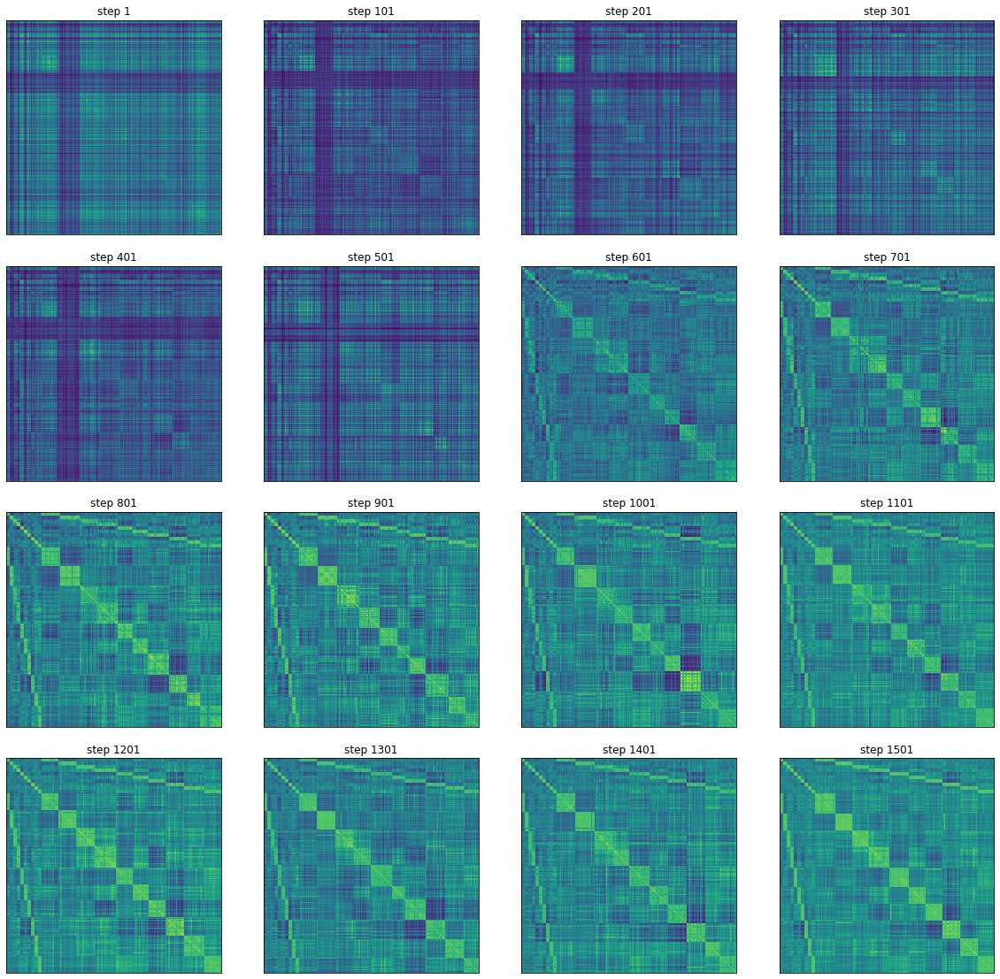

In [11]:
vis.imshow(similarities[1::2], labels=[f"step {i}" for i in list(range(100,1502, 200))], imgwidth=600, num_row=4, figsize=(20,20), hspace=0.1)
#plt.savefig("dotsimilarity.svg")

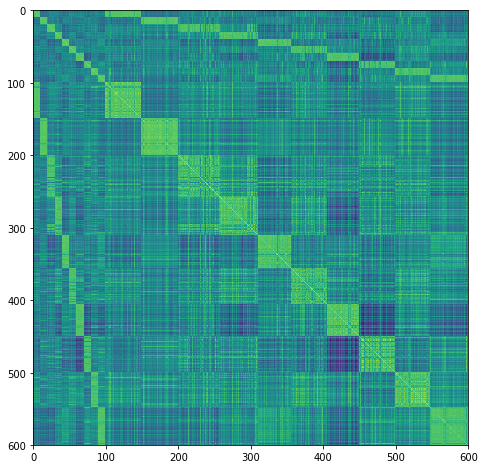

In [56]:
stacked = np.vstack([semb, uemb[ulabel.argsort()]])

import matplotlib.pyplot as plt 

plt.figure(figsize=(8,8))
plt.imshow(stacked @ stacked.T)
plt.savefig("dotsimilarity1501.svg")

In [17]:
sembs[5]

array([[ 0.78547233,  5.796182  ,  6.8463726 , ...,  3.869143  ,
         2.107624  , -0.50929314],
       [ 1.1453164 ,  7.2804713 ,  5.4066596 , ...,  3.1033025 ,
         2.7595663 , -0.8296944 ],
       [ 0.7974169 ,  8.123825  ,  7.8526096 , ...,  5.7234244 ,
         2.491347  , -0.6434266 ],
       ...,
       [ 0.13228627,  4.6095243 ,  5.6429963 , ...,  6.02078   ,
         2.1588304 , -0.73269546],
       [ 1.1241388 ,  4.4488215 ,  3.0144408 , ...,  3.2459068 ,
         0.3646978 , -0.7678554 ],
       [ 0.04160263,  3.9665203 ,  3.0387497 , ...,  2.8196416 ,
        -0.154459  , -0.34945953]], dtype=float32)

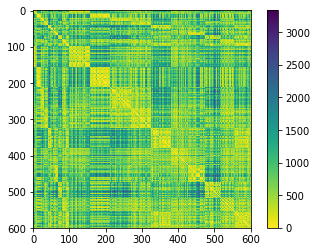

In [31]:
import tools.analyzer as ana

stacked = np.vstack([sembs[5], uembs[5][ulabels[5].argsort()]])

l2_dist = ana.get_pairwise_distance(stacked, ana.Distance.l2)
plt.imshow(l2_dist)
plt.set_cmap(plt.cm.viridis_r)
plt.colorbar()

In [76]:
import matplotlib
matplotlib.rcParams.update({'font.size': 40})

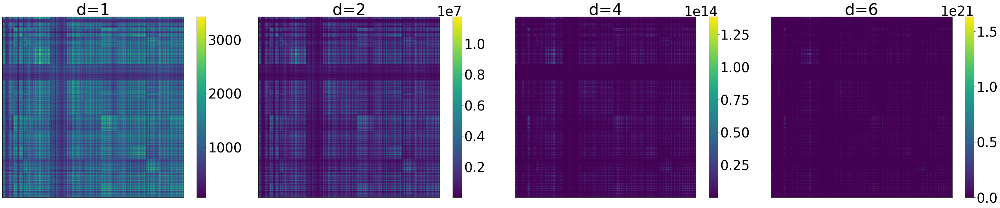

In [79]:
import tools.visualization as vis

kdot  = ana.get_pairwise_distance(stacked, ana.Distance.k_dot)
kpoly2 = ana.get_pairwise_distance(stacked, ana.Distance.get_polynomial_k(bias=0, exponent=2))
kpoly4 = ana.get_pairwise_distance(stacked, ana.Distance.get_polynomial_k(bias=0, exponent=4))
kpoly6 = ana.get_pairwise_distance(stacked, ana.Distance.get_polynomial_k(bias=0, exponent=6))
kpoly10 = ana.get_pairwise_distance(stacked, ana.Distance.get_polynomial_k(bias=0, exponent=10))

imgs = [kdot, kpoly2, kpoly4, kpoly6]
vis.imshow(imgs, imgwidth=600, cmap=True, num_row=4, figsize=(55,10), hspace=0, wspace=0, labels=["d=1","d=2","d=4", "d=6"])
plt.set_cmap(plt.cm.viridis)
plt.savefig("polykernels.svg")

In [92]:
import tools.visualization as vis

kg1 = ana.get_pairwise_distance(stacked, ana.Distance.get_gaussian_k(sigma=1))
kg5 = ana.get_pairwise_distance(stacked, ana.Distance.get_gaussian_k(sigma=5))
kg10 = ana.get_pairwise_distance(stacked, ana.Distance.get_gaussian_k(sigma=10))
kg25 = ana.get_pairwise_distance(stacked, ana.Distance.get_gaussian_k(sigma=25))
kg45 = ana.get_pairwise_distance(stacked, ana.Distance.get_gaussian_k(sigma=40))

imgs = [kg1, kg5, kg10, kg25, kg45]

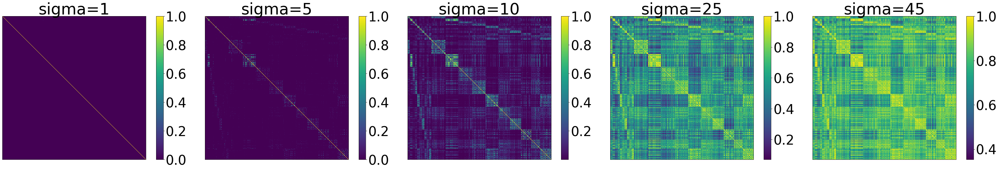

In [94]:
vis.imshow(imgs, imgwidth=600, cmap=True, num_row=5, figsize=(55,8), hspace=0, wspace=0, labels=["sigma=1","sigma=5","sigma=10", "sigma=25", "sigma=45"])
plt.set_cmap(plt.cm.viridis)
plt.savefig("sigmakernels.svg")